# **Importy**

In [11]:
# Imports
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import ParameterGrid
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, Flatten, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt


# **Model**

In [15]:
# Function to create the CNN model
def create_model(input_shape, optimizer='adam', loss_fn='mse'):
    model = Sequential([
        Conv1D(64, kernel_size=2, activation='relu', input_shape=input_shape),
        Conv1D(32, kernel_size=2, activation='relu'),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.3),  # Adding dropout to prevent overfitting
        Dense(64, activation='relu'),
        Dense(3)  # Output layer for the 3 direction components
    ])
    model.compile(optimizer=optimizer, loss=loss_fn, metrics=['mae'])
    return model

# **Funkcje rysujące**

In [41]:
# Plotting functions
def plot_loss_and_mae(history, class_name):
    # Plotting loss
    plt.figure(figsize=(12, 6))
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss for {class_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Plotting MAE
    plt.figure(figsize=(12, 6))
    plt.plot(history['mae'], label='Train MAE')
    plt.plot(history['val_mae'], label='Validation MAE')
    plt.title(f'Model MAE for {class_name}')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    plt.show()

def plot_true_vs_pred(y_test, y_pred, class_name):
    # XY Plane
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[:, 0], y_test[:, 1], label='True Directions', alpha=0.5)
    plt.scatter(y_pred[:, 0], y_pred[:, 1], label='Predicted Directions', alpha=0.5)
    plt.title(f'Comparison of True and Predicted Directions for {class_name} (XY Plane)')
    plt.xlabel('X Direction')
    plt.ylabel('Y Direction')
    plt.legend()
    plt.show()

    # XZ Plane
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[:, 0], y_test[:, 2], label='True Directions', alpha=0.5)
    plt.scatter(y_pred[:, 0], y_pred[:, 2], label='Predicted Directions', alpha=0.5)
    plt.title(f'Comparison of True and Predicted Directions for {class_name} (XZ Plane)')
    plt.xlabel('X Direction')
    plt.ylabel('Z Direction')
    plt.legend()
    plt.show()

    # YZ Plane
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test[:, 1], y_test[:, 2], label='True Directions', alpha=0.5)
    plt.scatter(y_pred[:, 1], y_pred[:, 2], label='Predicted Directions', alpha=0.5)
    plt.title(f'Comparison of True and Predicted Directions for {class_name} (YZ Plane)')
    plt.xlabel('Y Direction')
    plt.ylabel('Z Direction')
    plt.legend()
    plt.show()

# Function to plot combined results
def plot_combined_results(histories, predictions):
    # Separate loss plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['loss'], label=f'{class_name} Train Loss')
    plt.title('Combined Model Train Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Separate validation loss plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['val_loss'], label=f'{class_name} Validation Loss')
    plt.title('Combined Model Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Loss')
    plt.legend()
    plt.show()

    # Separate MAE plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['mae'], label=f'{class_name} Train MAE')
    plt.title('Combined Model Train MAE')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    plt.show()

    # Separate validation MAE plot
    plt.figure(figsize=(12, 6))
    for class_name, history in histories.items():
        plt.plot(history['val_mae'], label=f'{class_name} Validation MAE')
    plt.title('Combined Model Validation MAE')
    plt.xlabel('Epoch')
    plt.ylabel('Validation MAE')
    plt.legend()
    plt.show()

# **Przygotowywanie danych**

In [17]:
# Function to load and preprocess data
def load_and_preprocess_data(file_list, target_class):
    for file in file_list:
        class_name = file.split('_')[-1].split('.')[0]  # Extract class name from file name
        if class_name == target_class:
            df = pd.read_hdf(file, "y")
            X = df[['jmuon_dir_x', 'jmuon_dir_y', 'jmuon_dir_z', 'jmuon_likelihood']].values
            y = df[['dir_x', 'dir_y', 'dir_z']].values

            # Replace NaNs with zeros
            X = np.nan_to_num(X)
            y = np.nan_to_num(y)

            return X, y
    raise ValueError(f"Class {target_class} not found in file list.")


file_list = [
    'atm_neutrino_classA.h5', 'atm_neutrino_classB.h5', 'atm_neutrino_classC.h5', 'atm_neutrino_classD.h5',
    'atm_neutrino_classE.h5', 'atm_neutrino_classF.h5', 'atm_neutrino_classG.h5', 'atm_neutrino_classH.h5'
]

results = {}
histories = {}
predictions = {}


In [10]:
data = load_and_preprocess_data(file_list, 'classA')
data

(array([[-8.00045733e-02, -1.38303317e-01, -9.87153210e-01,
          5.63915027e+01],
        [ 8.77165151e-02,  8.69920161e-01, -4.85329503e-01,
          1.09102307e+02],
        [ 7.45612023e-02,  9.61560325e-01,  2.64277068e-01,
          4.76508443e+01],
        ...,
        [ 2.65909785e-03, -5.22860602e-01, -8.52414055e-01,
          4.10782818e+01],
        [-3.88724866e-01, -4.16375859e-01,  8.21902745e-01,
          2.97533206e+01],
        [-1.78340376e-01, -3.50097996e-01,  9.19579308e-01,
          3.25085533e+01]]),
 array([[-0.04267864, -0.23472526, -0.97112439],
        [ 0.14727986,  0.88143217, -0.44876048],
        [-0.77812669,  0.33399661,  0.53194466],
        ...,
        [ 0.10942167, -0.49838145, -0.8600249 ],
        [-0.84861318,  0.48039117,  0.22154006],
        [ 0.82308651, -0.41881998,  0.38356019]]))

# **Funkcja trenująca model**

In [24]:
# Function to train the model with given hyperparameters
def train_model(class_name, X, y, epochs, batch_size, optimizer_type, loss_fn_type, show_plot=True):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Normalize the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Reshape data to fit Conv1D input requirements
    X_train_cnn = np.expand_dims(X_train_scaled, axis=2)
    X_test_cnn = np.expand_dims(X_test_scaled, axis=2)

    # Create and train the model
    model = create_model((X_train_cnn.shape[1], X_train_cnn.shape[2]), optimizer=optimizer_type, loss_fn=loss_fn_type)
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(X_train_cnn, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2,
                        callbacks=[early_stopping])

    # Evaluate the model
    loss, mae = model.evaluate(X_test_cnn, y_test)
    print(f'Test MAE for {class_name}: {mae}')

    # Store the results
    results[class_name] = {'model': model, 'mae': mae}
    histories[class_name] = history.history

    # Make predictions
    y_pred = model.predict(X_test_cnn)
    predictions[class_name] = (y_test, y_pred)

    # Compare predicted directions with true directions
    comparison = pd.DataFrame({
        'true_x': y_test[:, 0], 'true_y': y_test[:, 1], 'true_z': y_test[:, 2],
        'pred_x': y_pred[:, 0], 'pred_y': y_pred[:, 1], 'pred_z': y_pred[:, 2]
    })
    print(f'Comparison for {class_name}:')
    print(comparison.head())

    if(show_plot):
      # Plot loss and MAE for the current class
      plot_loss_and_mae(history.history, class_name)
      # Plot true vs predicted directions for the current class
      plot_true_vs_pred(y_test, y_pred, class_name)

    return mae


# **Hiperparametryzacja**

In [29]:
# Function to run experiment with hyperparameters for a single class
def run_hyperparameterization(file_list, class_name, batch_size, lr, epochs, patience, optimizer_type, loss_fn_type):
    X, y = load_and_preprocess_data(file_list, class_name)
    best_loss = float('inf')
    best_params = None

    print(f"Training on class {class_name} with parameters: batch_size={batch_size}, lr={lr}, epochs={epochs}, patience={patience}, optimizer_type={optimizer_type}, loss_fn_type={loss_fn_type}")
    mae = train_model(class_name, X, y, epochs, batch_size, optimizer_type, loss_fn_type, show_plot=False)

    if mae < best_loss:
        best_loss = mae
        best_params = {
            'batch_size': batch_size,
            'lr': lr,
            'epochs': epochs,
            'patience': patience,
            'optimizer_type': optimizer_type,
            'loss_fn_type': loss_fn_type
        }

    return best_params, best_loss


def hyperparameterization(file_list, class_name):
    # Hyperparameter grid
    param_grid = {
        'optimizer_type': ['adam', 'sgd'],
        'loss_fn_type': ['mse', 'mae'],
        'lr': [0.0001, 0.001, 0.01],
        'batch_size': [16, 32, 64, 128],
        'epochs': [50],
        'patience': [10]
    }

    best_overall_params = None
    best_overall_loss = float('inf')

    # Iterate over all combinations of hyperparameters
    print(f"Starting hyperparameterization for class {class_name}")
    for params in ParameterGrid(param_grid):
        print(f"Params: {params}")
        best_params, best_loss = run_hyperparameterization(
            file_list,
            class_name,
            params['batch_size'],
            params['lr'],
            params['epochs'],
            params['patience'],
            params['optimizer_type'],
            params['loss_fn_type']
        )
        print(f"Best Validation Loss for current set: {best_loss:.4f}")
        if best_loss < best_overall_loss:
            best_overall_loss = best_loss
            best_overall_params = best_params

    print(f"Best Overall Parameters for class {class_name}: {best_overall_params}")
    print(f"Best Overall Validation Loss for class {class_name}: {best_overall_loss:.4f}")
    return best_overall_params



# **Zastosowanie hiperparametryzacji na danych z klasy A**

In [ ]:
class_name = 'classA'
best_params = hyperparameterization(file_list, class_name)

In [31]:
print(best_params)

{'batch_size': 16, 'lr': 0.001, 'epochs': 50, 'patience': 10, 'optimizer_type': 'sgd', 'loss_fn_type': 'mae'}


# **Trenowanie modelu na danych z klasy A**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


323/323 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4769 - mae: 0.4769 - val_loss: 0.3920 - val_mae: 0.3920
Epoch 2/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3806 - mae: 0.3806 - val_loss: 0.3201 - val_mae: 0.3201
Epoch 3/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3361 - mae: 0.3361 - val_loss: 0.2886 - val_mae: 0.2886
Epoch 4/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3074 - mae: 0.3074 - val_loss: 0.2716 - val_mae: 0.2716
Epoch 5/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2966 - mae: 0.2966 - val_loss: 0.2697 - val_mae: 0.2697
Epoch 6/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2936 - mae: 0.2936 - val_loss: 0.2685 - val_mae: 0.2685
Epoch 7/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2917 - mae: 0.2917 - val_loss: 0.2677 - val_mae: 0.2677
Epoch 8/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2906 - mae: 0.2906 - val_loss: 0.2678 - val_mae: 0.2678
Epoch 9/50
323/323 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2868 

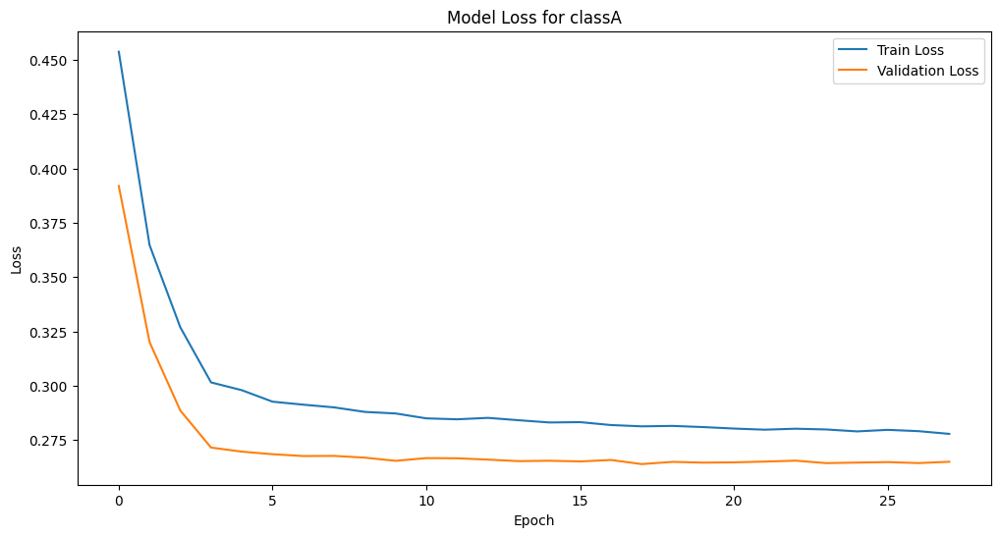

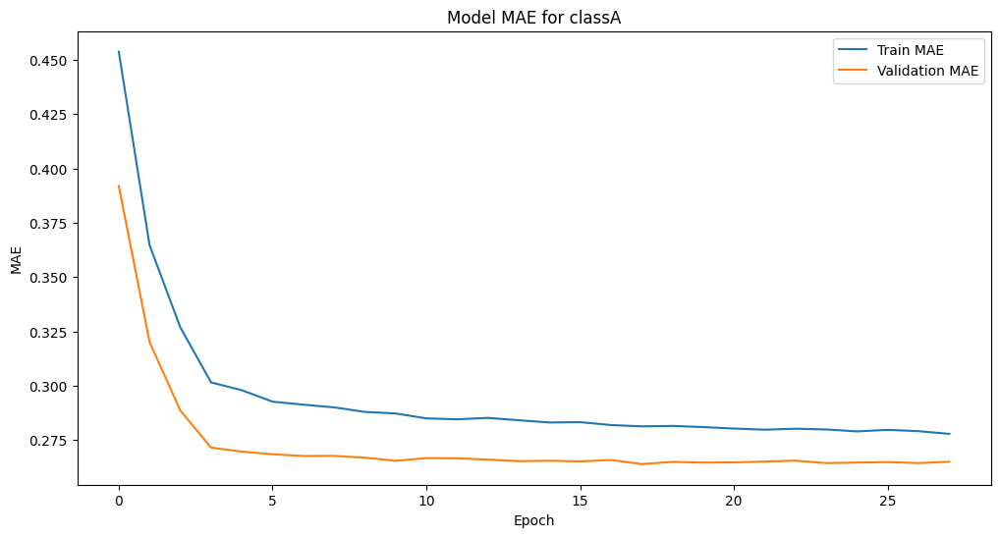

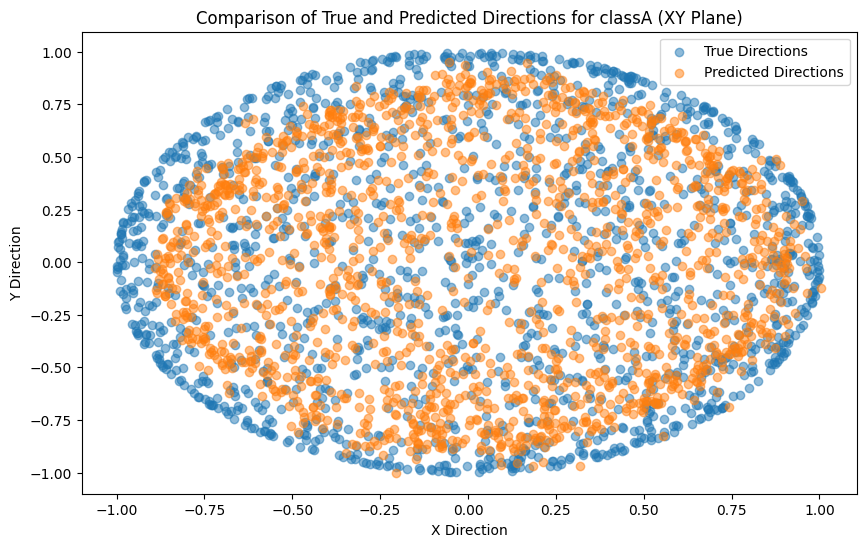

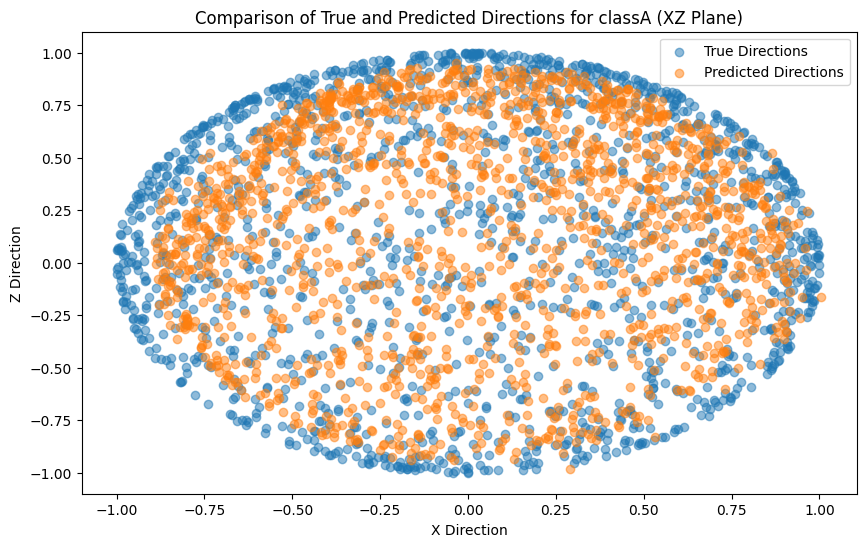

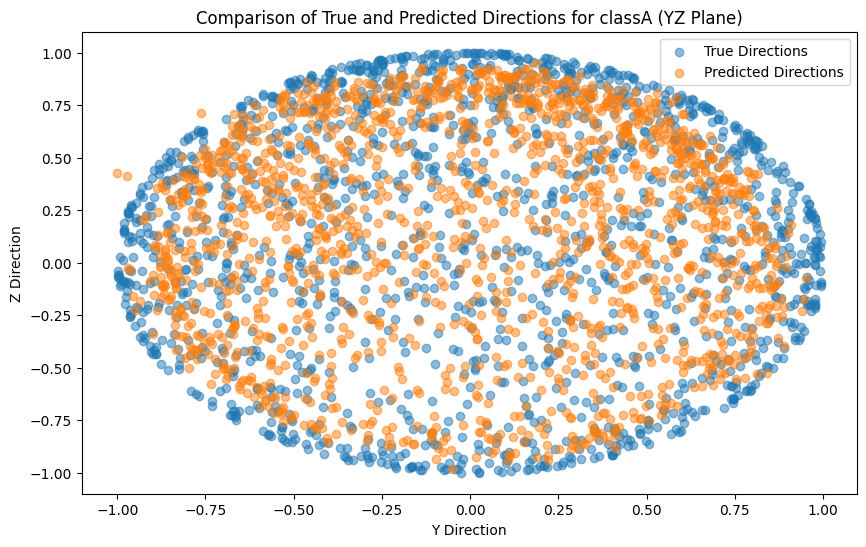

In [32]:
class_name = 'classA'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Trenowanie modelu na danych z klasy B**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


1023/1023 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.4037 - mae: 0.4037 - val_loss: 0.1925 - val_mae: 0.1925
Epoch 2/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2298 - mae: 0.2298 - val_loss: 0.1880 - val_mae: 0.1880
Epoch 3/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2191 - mae: 0.2191 - val_loss: 0.1882 - val_mae: 0.1882
Epoch 4/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2125 - mae: 0.2125 - val_loss: 0.1849 - val_mae: 0.1849
Epoch 5/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2087 - mae: 0.2087 - val_loss: 0.1837 - val_mae: 0.1837
Epoch 6/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2097 - mae: 0.2097 - val_loss: 0.1832 - val_mae: 0.1832
Epoch 7/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2077 - mae: 0.2077 - val_loss: 0.1835 - val_mae: 0.1835
Epoch 8/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2070 - mae: 0.2070 - val_loss: 0.1839 - val_mae: 0.1839
Epoch 9/50
1023/1023 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/st

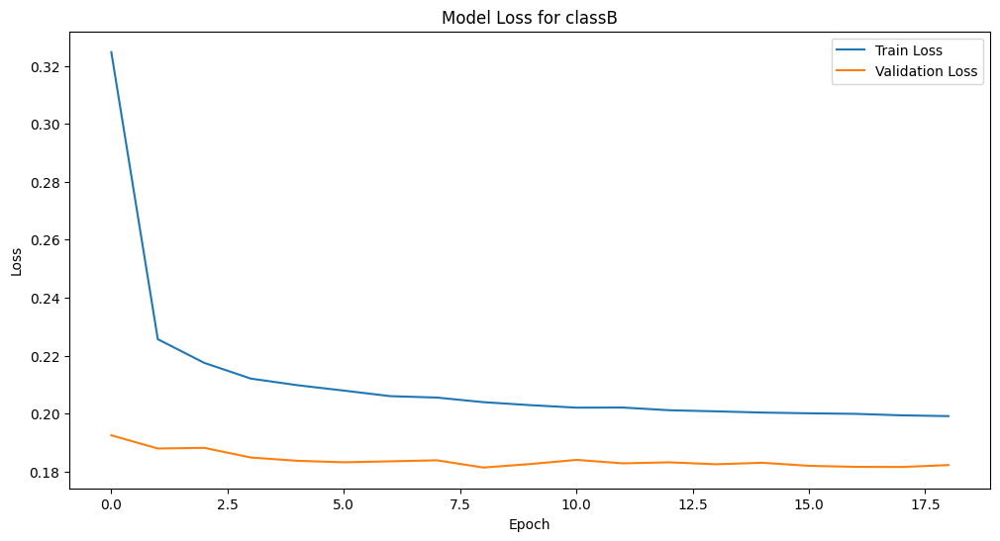

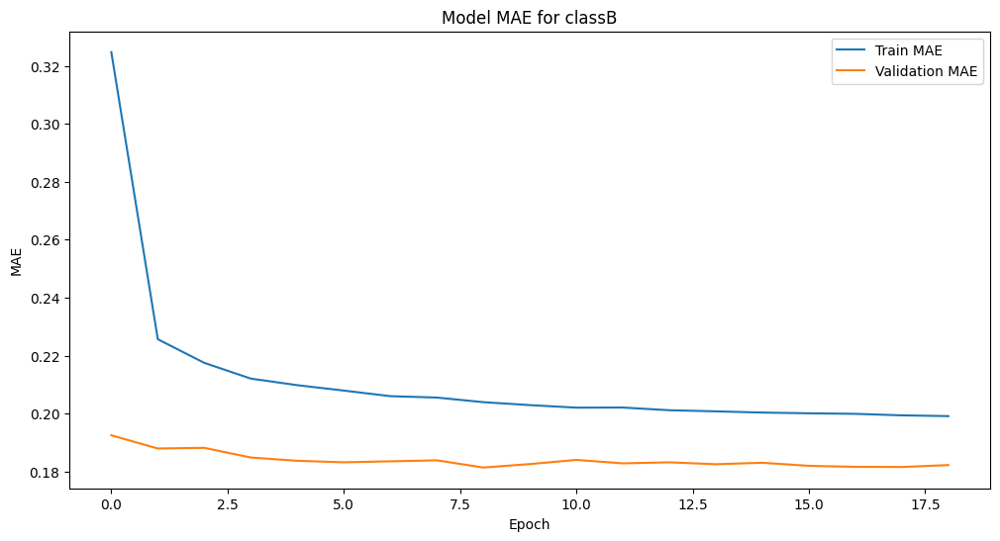

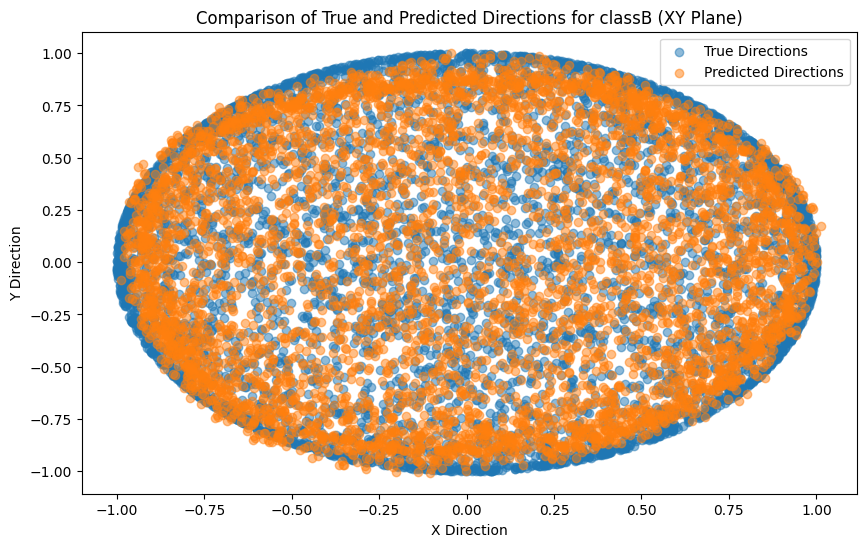

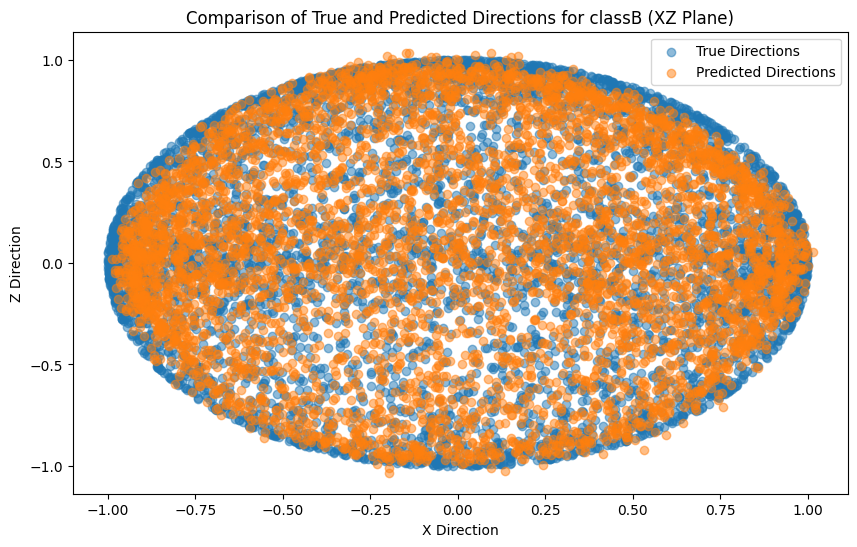

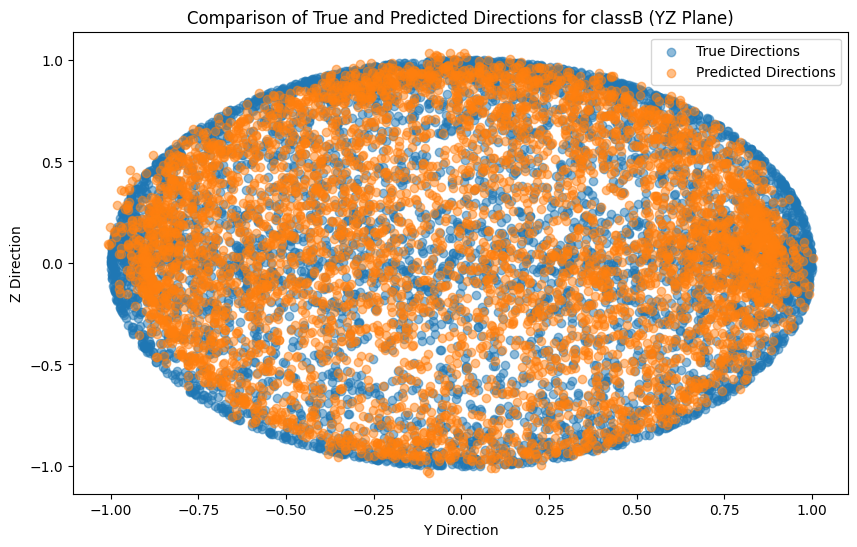

In [33]:
class_name = 'classB'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Trenowanie modelu na danych z klasy C**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


267/267 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4966 - mae: 0.4966 - val_loss: 0.4454 - val_mae: 0.4454
Epoch 2/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4361 - mae: 0.4361 - val_loss: 0.3700 - val_mae: 0.3700
Epoch 3/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3670 - mae: 0.3670 - val_loss: 0.3170 - val_mae: 0.3170
Epoch 4/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3321 - mae: 0.3321 - val_loss: 0.3066 - val_mae: 0.3066
Epoch 5/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3303 - mae: 0.3303 - val_loss: 0.3041 - val_mae: 0.3041
Epoch 6/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3255 - mae: 0.3255 - val_loss: 0.3040 - val_mae: 0.3040
Epoch 7/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3204 - mae: 0.3204 - val_loss: 0.3025 - val_mae: 0.3025
Epoch 8/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3220 - mae: 0.3220 - val_loss: 0.3012 - val_mae: 0.3012
Epoch 9/50
267/267 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3196 

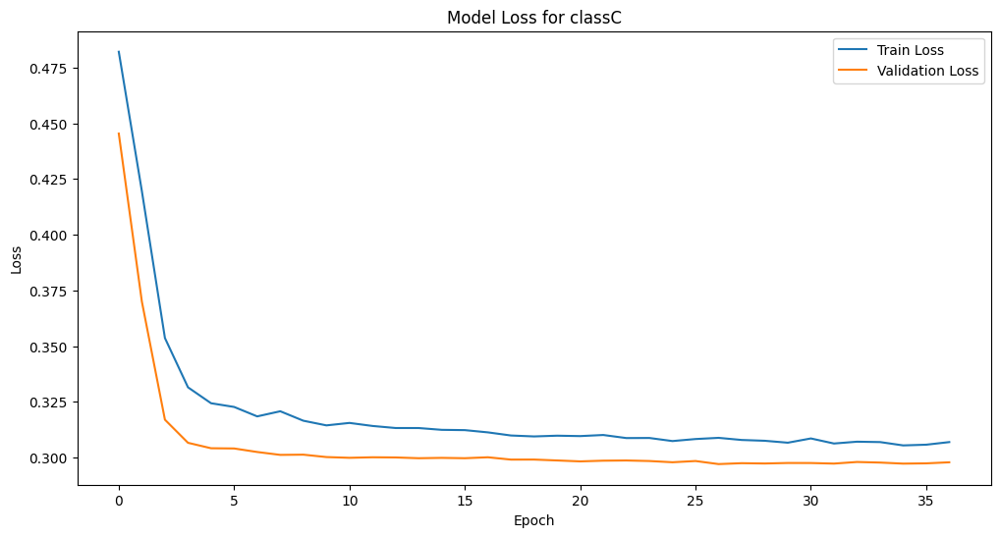

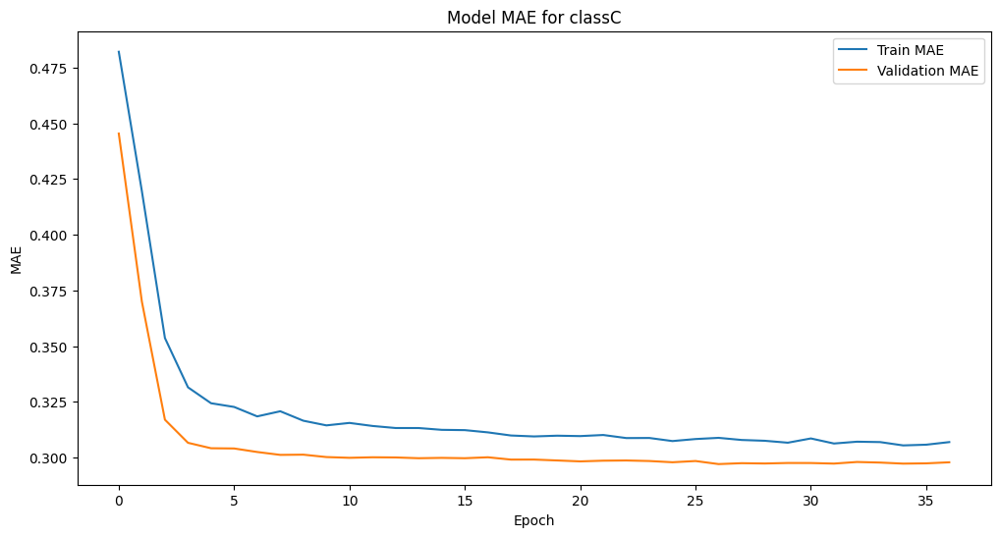

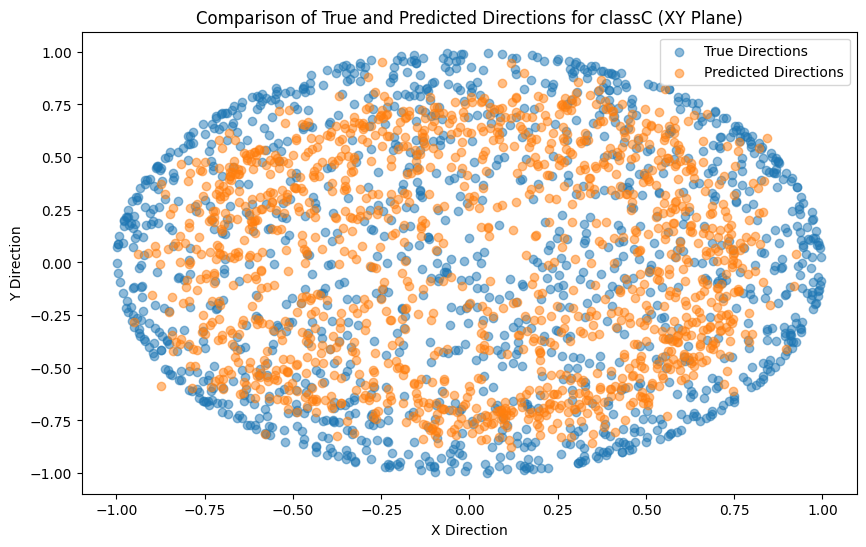

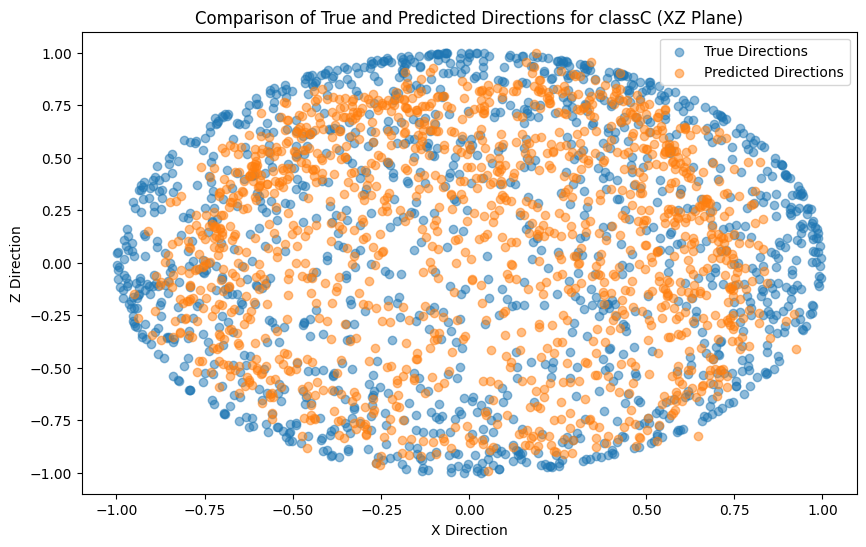

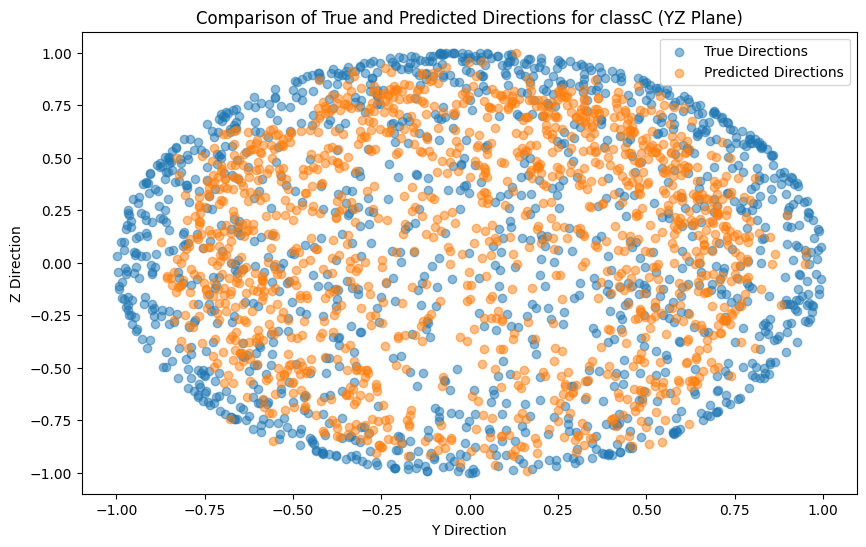

In [34]:
class_name = 'classC'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Trenowanie modelu na danych z klasy D**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


1742/1742 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3800 - mae: 0.3800 - val_loss: 0.2440 - val_mae: 0.2440
Epoch 2/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2625 - mae: 0.2625 - val_loss: 0.2412 - val_mae: 0.2412
Epoch 3/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2590 - mae: 0.2590 - val_loss: 0.2396 - val_mae: 0.2396
Epoch 4/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2530 - mae: 0.2530 - val_loss: 0.2410 - val_mae: 0.2410
Epoch 5/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2517 - mae: 0.2517 - val_loss: 0.2418 - val_mae: 0.2418
Epoch 6/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2533 - mae: 0.2533 - val_loss: 0.2416 - val_mae: 0.2416
Epoch 7/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2502 - mae: 0.2502 - val_loss: 0.2394 - val_mae: 0.2394
Epoch 8/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2501 - mae: 0.2501 - val_loss: 0.2382 - val_mae: 0.2382
Epoch 9/50
1742/1742 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/st

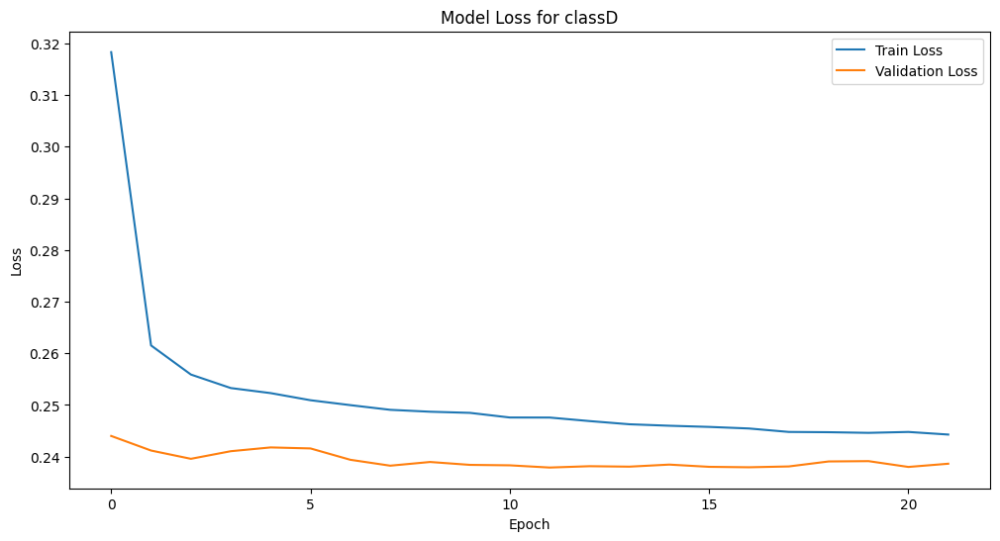

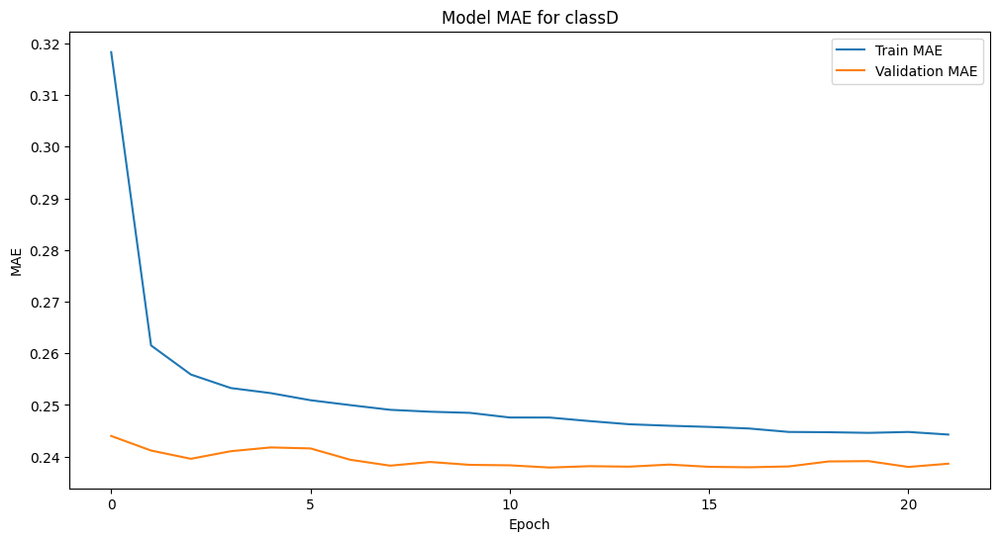

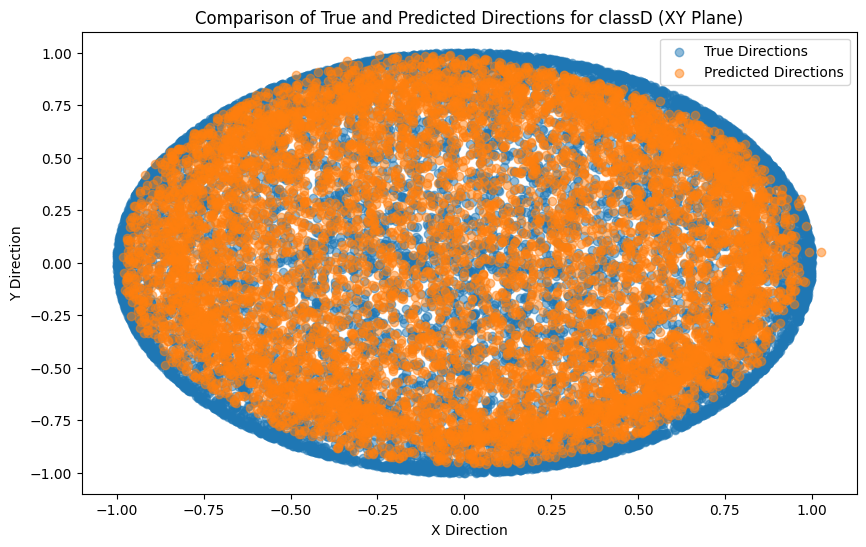

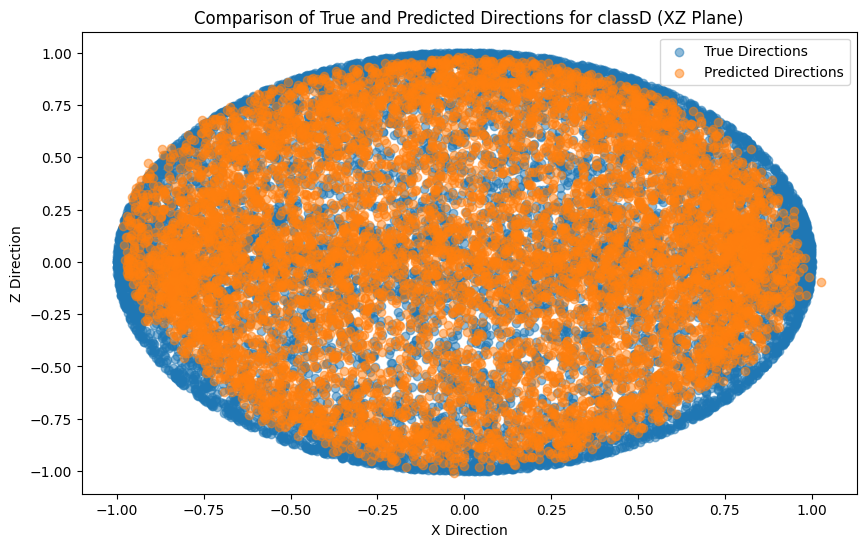

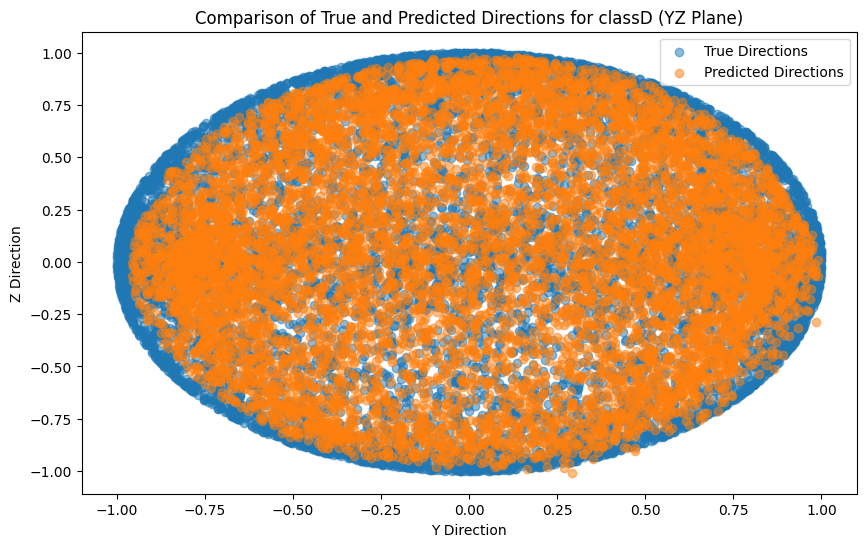

In [35]:
class_name = 'classD'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Trenowanie modelu na danych z klasy E**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.4491 - mae: 0.4491 - val_loss: 0.3349 - val_mae: 0.3349
Epoch 2/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3329 - mae: 0.3329 - val_loss: 0.2948 - val_mae: 0.2948
Epoch 3/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3083 - mae: 0.3083 - val_loss: 0.2905 - val_mae: 0.2905
Epoch 4/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2995 - mae: 0.2995 - val_loss: 0.2890 - val_mae: 0.2890
Epoch 5/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3002 - mae: 0.3002 - val_loss: 0.2887 - val_mae: 0.2887
Epoch 6/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2951 - mae: 0.2951 - val_loss: 0.2885 - val_mae: 0.2885
Epoch 7/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2969 - mae: 0.2969 - val_loss: 0.2875 - val_mae: 0.2875
Epoch 8/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2954 - mae: 0.2954 - val_loss: 0.2876 - val_mae: 0.2876
Epoch 9/50
901/901 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2984 

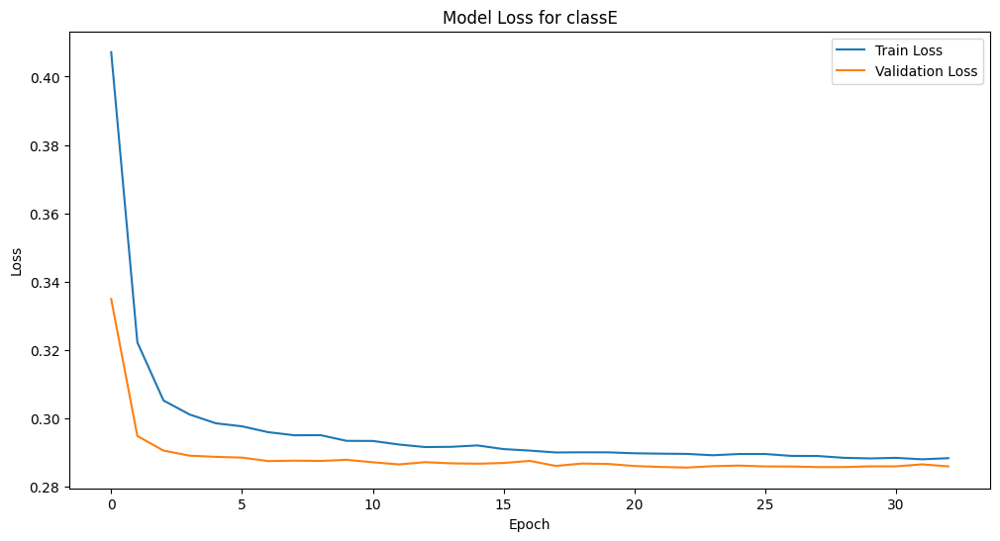

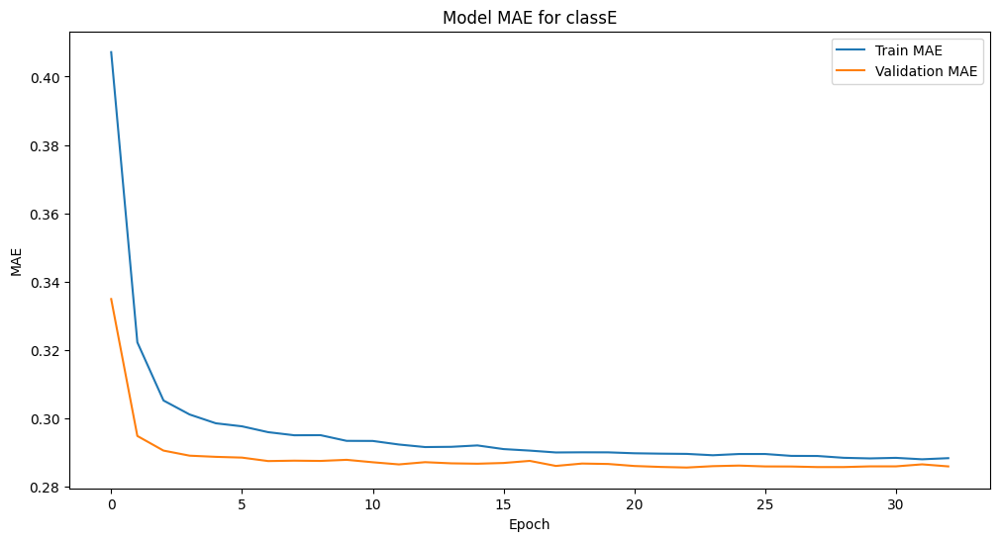

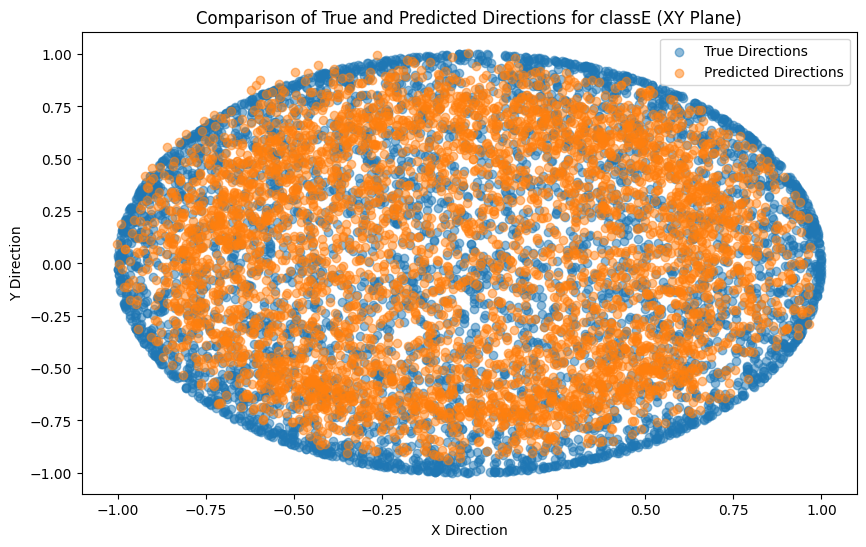

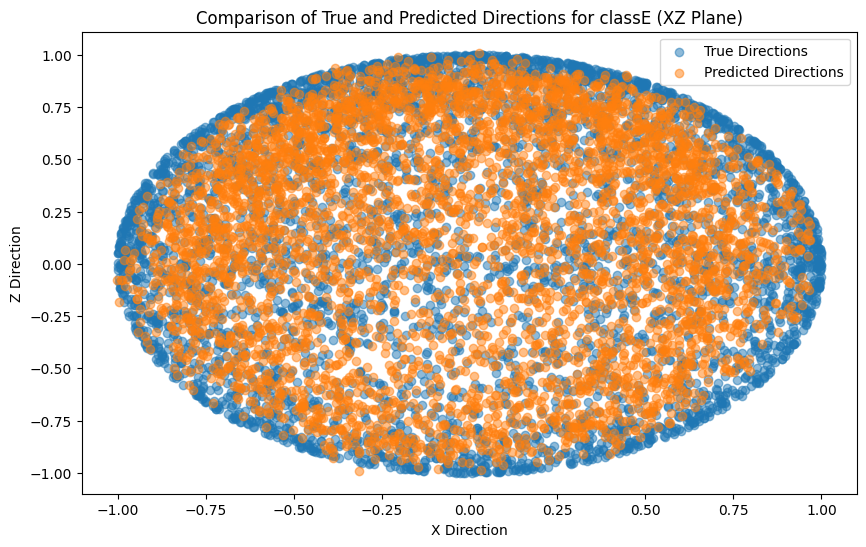

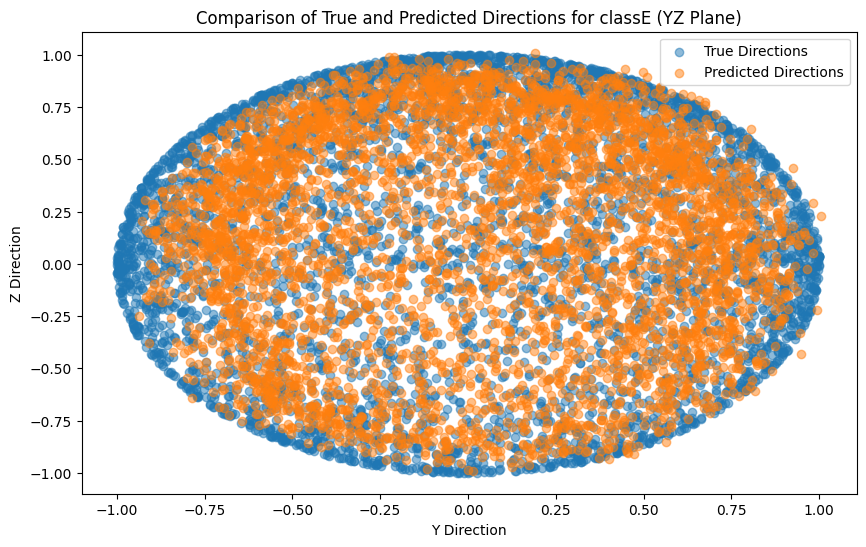

In [36]:
class_name = 'classE'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Trenowanie modelu na danych z klasy F**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3490 - mae: 0.3490 - val_loss: 0.2166 - val_mae: 0.2166
Epoch 2/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2361 - mae: 0.2361 - val_loss: 0.2083 - val_mae: 0.2083
Epoch 3/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2306 - mae: 0.2306 - val_loss: 0.2090 - val_mae: 0.2090
Epoch 4/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2271 - mae: 0.2271 - val_loss: 0.2089 - val_mae: 0.2089
Epoch 5/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2248 - mae: 0.2248 - val_loss: 0.2068 - val_mae: 0.2068
Epoch 6/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2235 - mae: 0.2235 - val_loss: 0.2064 - val_mae: 0.2064
Epoch 7/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2237 - mae: 0.2237 - val_loss: 0.2078 - val_mae: 0.2078
Epoch 8/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.2224 - mae: 0.2224 - val_loss: 0.2060 - val_mae: 0.2060
Epoch 9/50
2459/2459 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/st

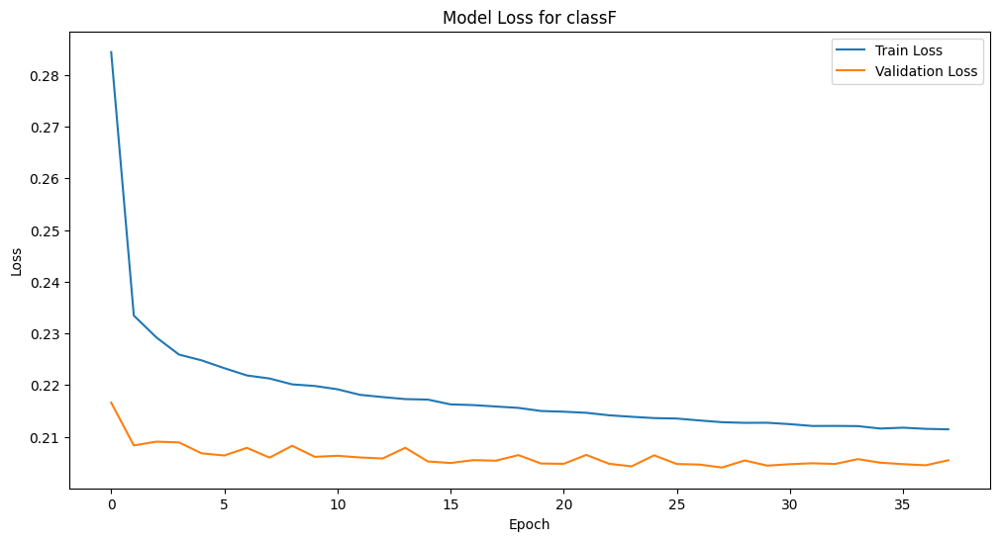

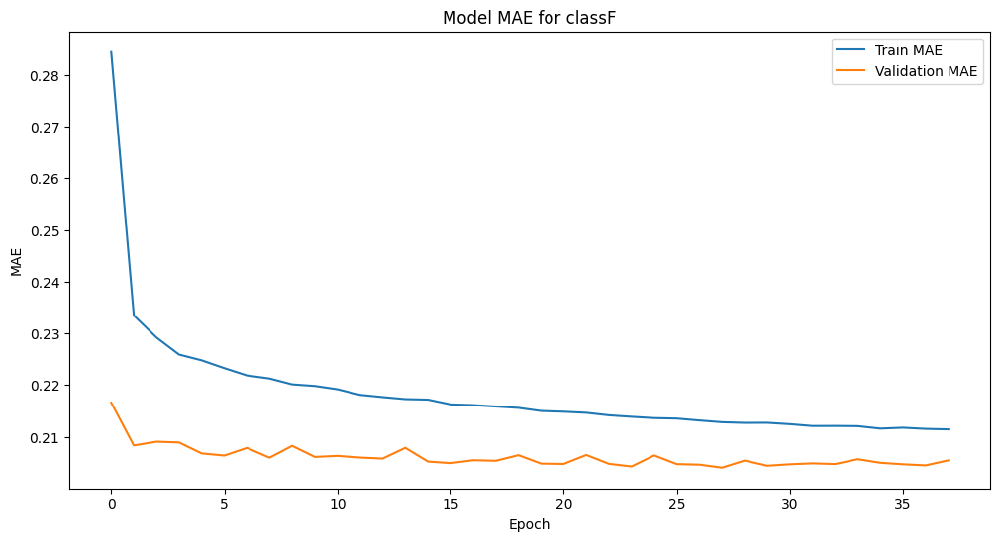

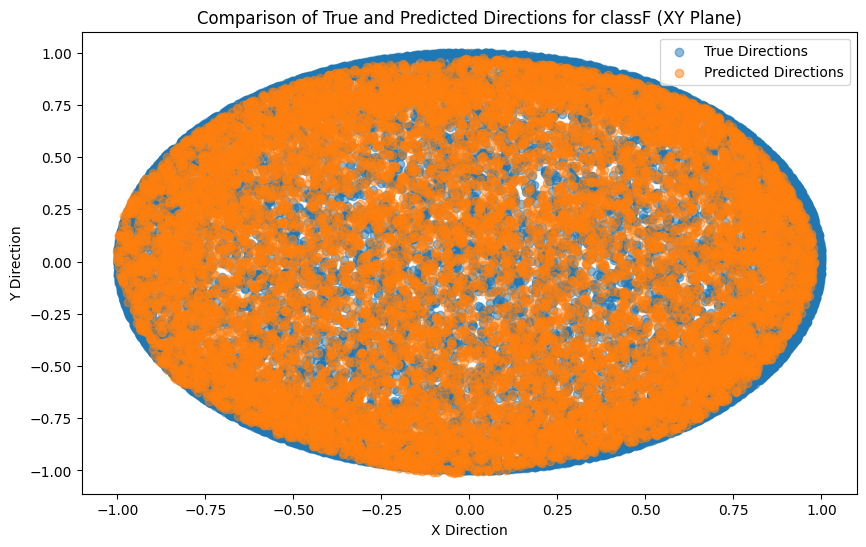

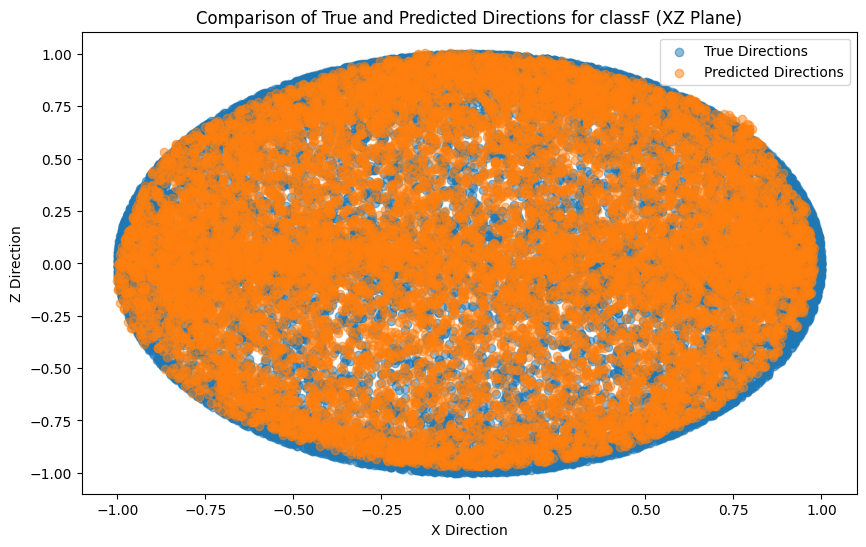

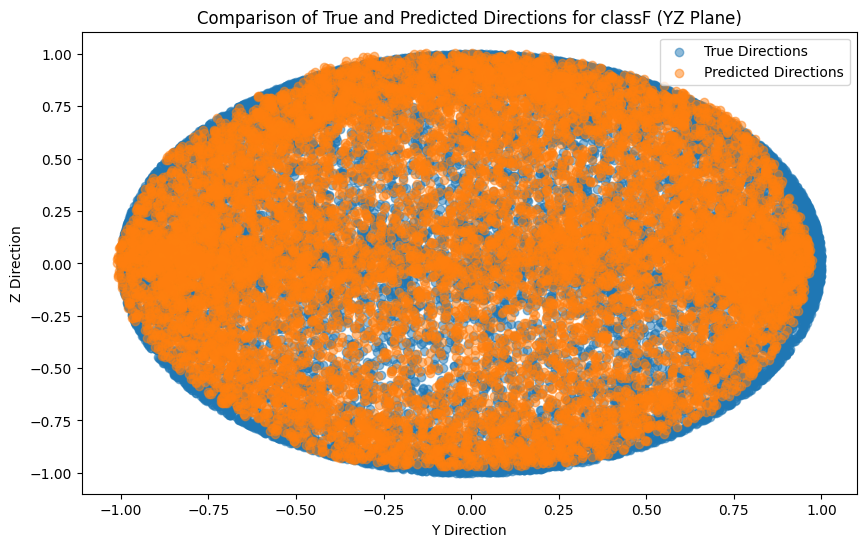

In [37]:
class_name = 'classF'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Trenowanie modelu na danych z klasy G**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


1973/1973 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4113 - mae: 0.4113 - val_loss: 0.3002 - val_mae: 0.3002
Epoch 2/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3123 - mae: 0.3123 - val_loss: 0.2963 - val_mae: 0.2963
Epoch 3/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3082 - mae: 0.3082 - val_loss: 0.2968 - val_mae: 0.2968
Epoch 4/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3052 - mae: 0.3052 - val_loss: 0.2946 - val_mae: 0.2946
Epoch 5/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3047 - mae: 0.3047 - val_loss: 0.2950 - val_mae: 0.2950
Epoch 6/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3034 - mae: 0.3034 - val_loss: 0.2940 - val_mae: 0.2940
Epoch 7/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3017 - mae: 0.3017 - val_loss: 0.2930 - val_mae: 0.2930
Epoch 8/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.3036 - mae: 0.3036 - val_loss: 0.2935 - val_mae: 0.2935
Epoch 9/50
1973/1973 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/st

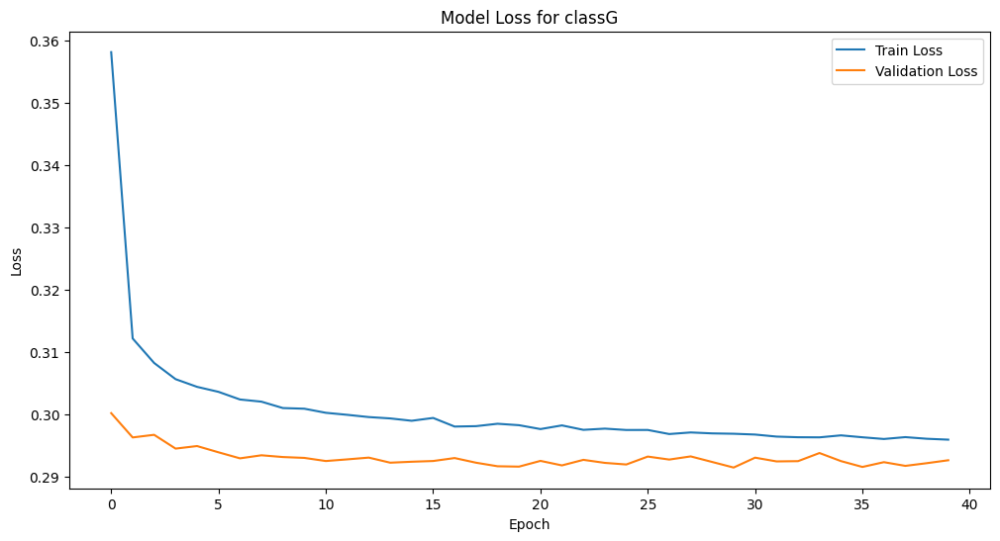

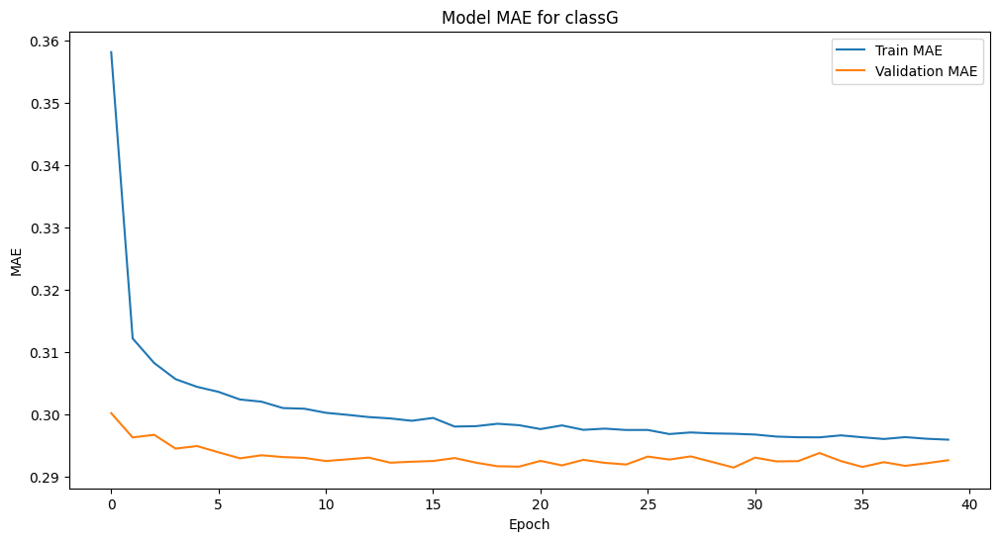

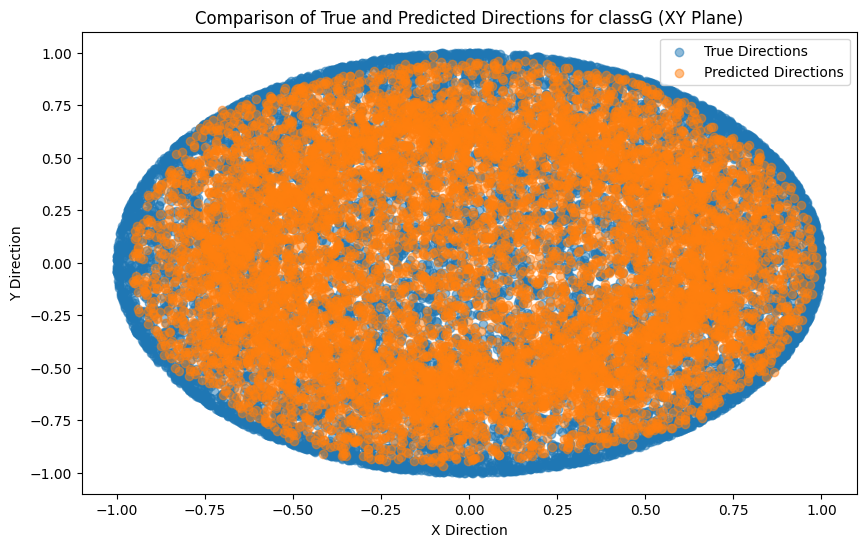

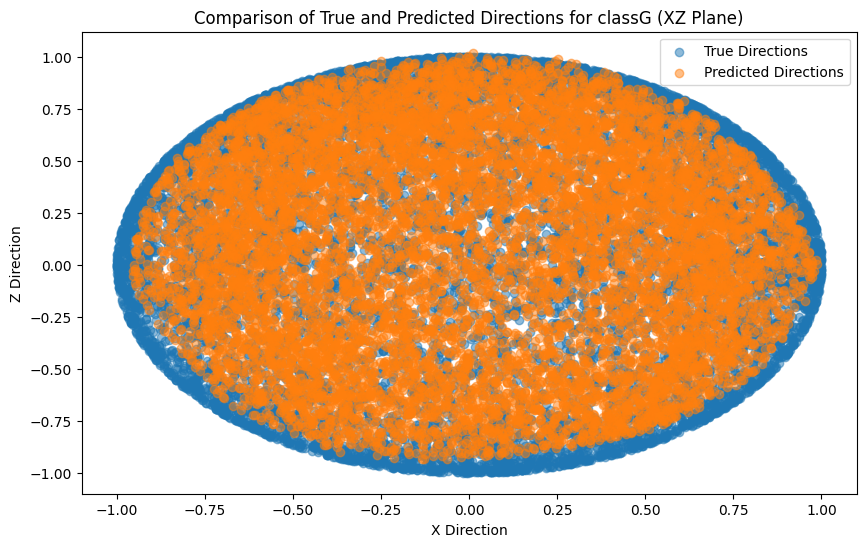

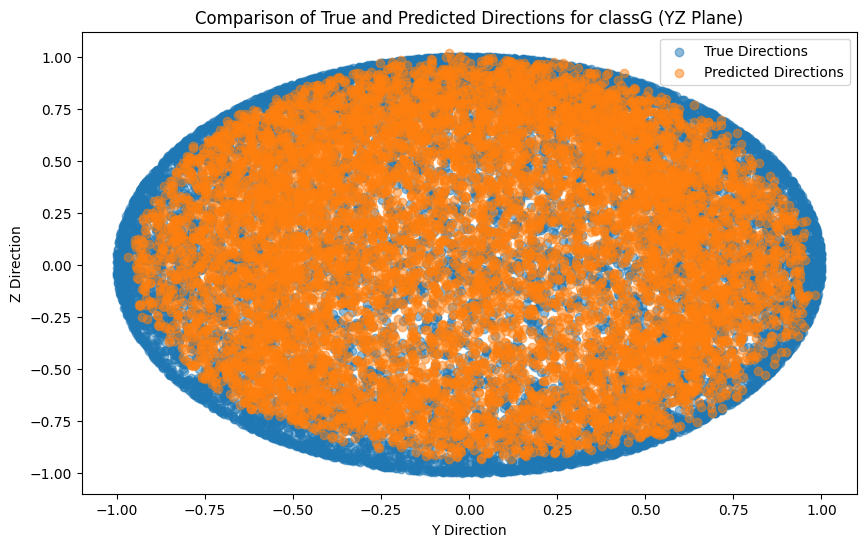

In [38]:
class_name = 'classG'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Trenowanie modelu na danych z klasy H**

Epoch 1/50


c:\Users\oicmy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


1730/1730 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3999 - mae: 0.3999 - val_loss: 0.2533 - val_mae: 0.2533
Epoch 2/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2697 - mae: 0.2697 - val_loss: 0.2528 - val_mae: 0.2528
Epoch 3/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2632 - mae: 0.2632 - val_loss: 0.2492 - val_mae: 0.2492
Epoch 4/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2606 - mae: 0.2606 - val_loss: 0.2487 - val_mae: 0.2487
Epoch 5/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2576 - mae: 0.2576 - val_loss: 0.2478 - val_mae: 0.2478
Epoch 6/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2563 - mae: 0.2563 - val_loss: 0.2480 - val_mae: 0.2480
Epoch 7/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2565 - mae: 0.2565 - val_loss: 0.2488 - val_mae: 0.2488
Epoch 8/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.2543 - mae: 0.2543 - val_loss: 0.2482 - val_mae: 0.2482
Epoch 9/50
1730/1730 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/st

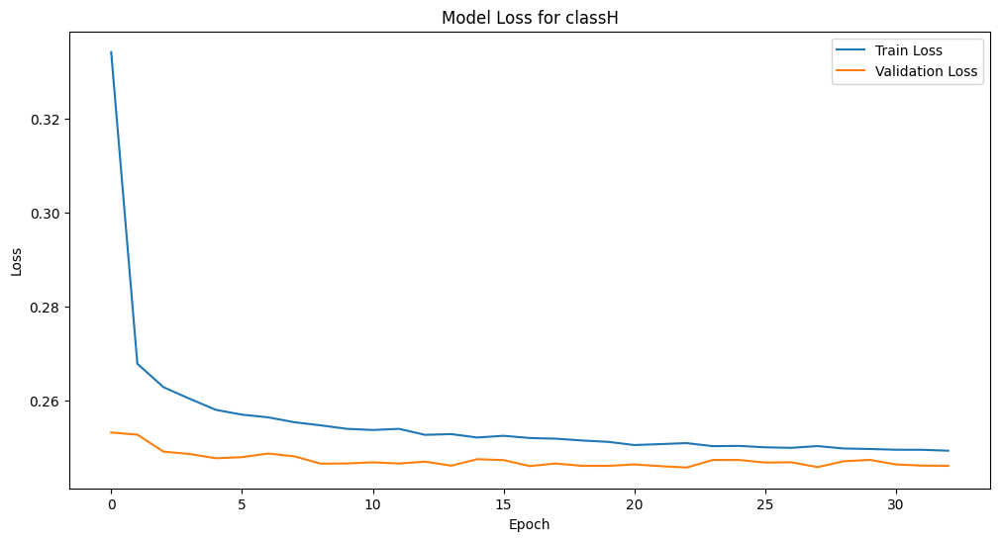

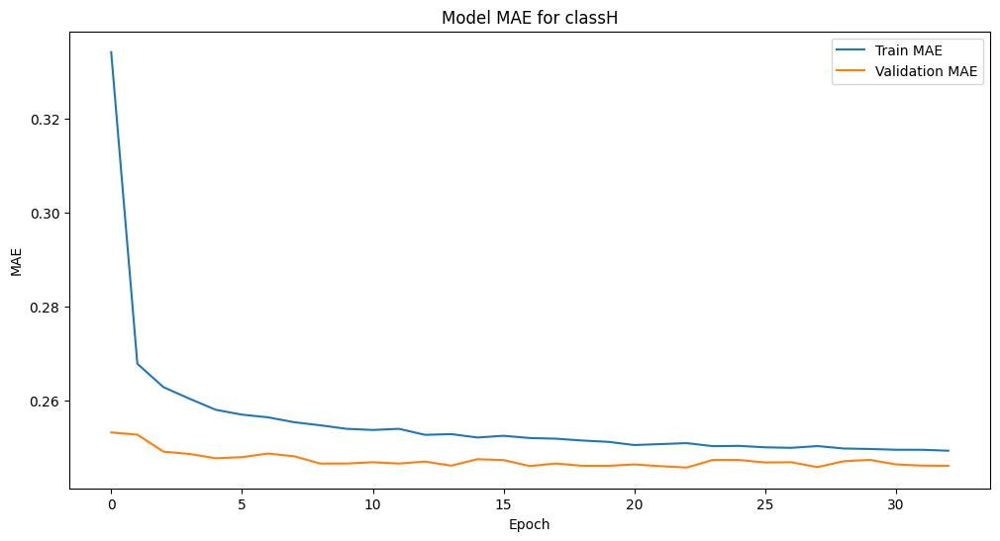

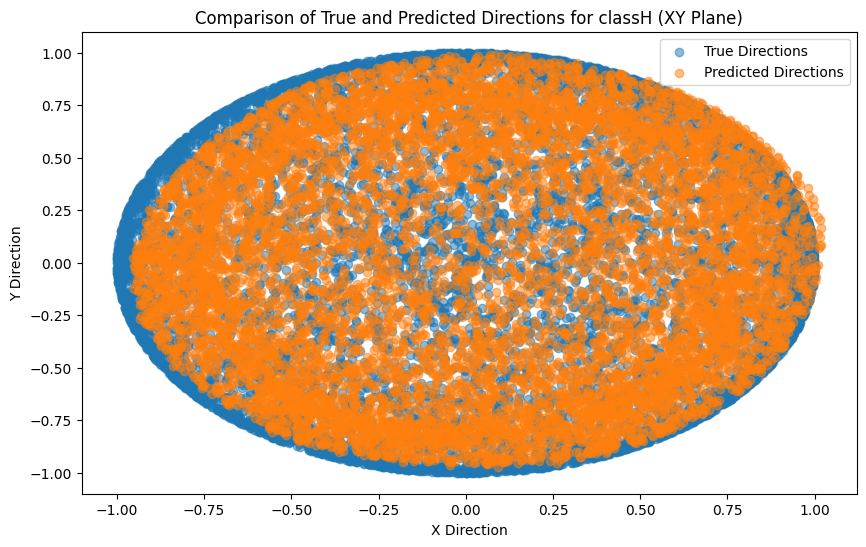

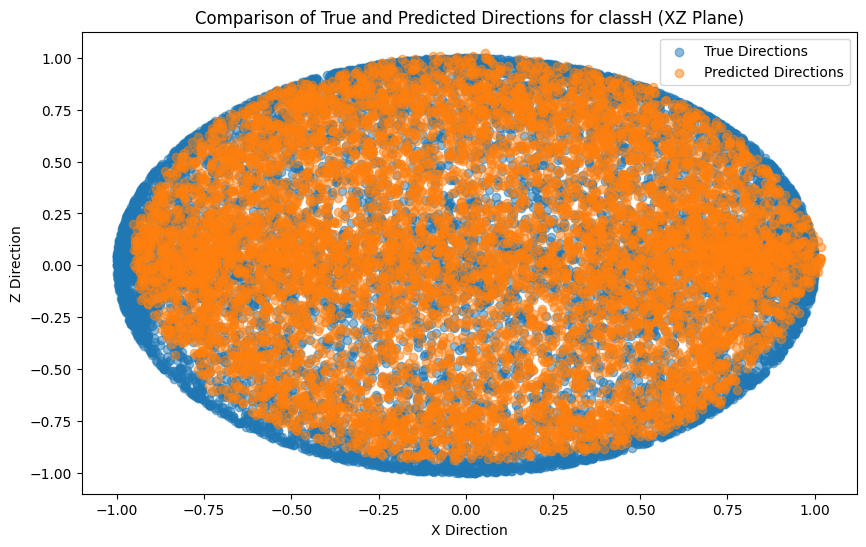

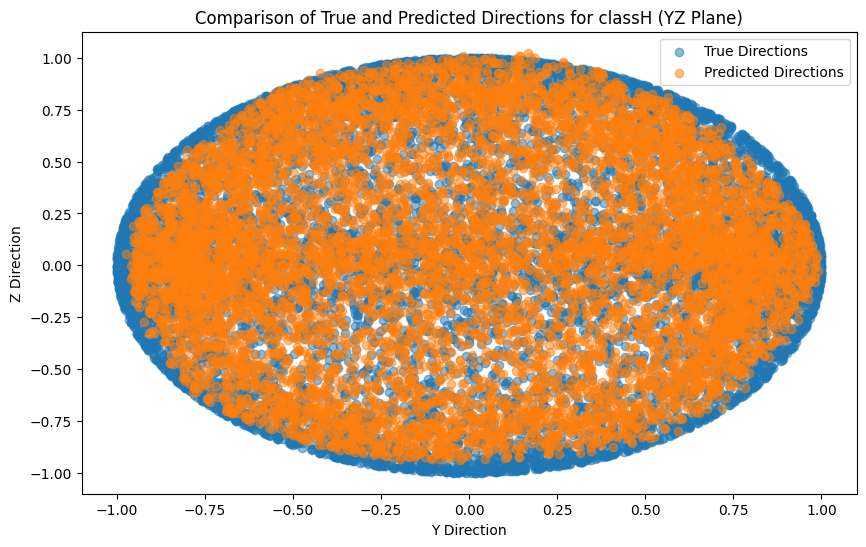

In [39]:
class_name = 'classH'

if best_params:
    X, y = load_and_preprocess_data(file_list, class_name)
    train_model(
        class_name=class_name,
        X=X,
        y=y,
        epochs=best_params['epochs'],
        batch_size=best_params['batch_size'],
        optimizer_type=best_params['optimizer_type'],
        loss_fn_type=best_params['loss_fn_type']
    )
else:
    print("Best parameters not found. Please ensure the hyperparameter search was executed correctly.")

# **Podsumowanie**

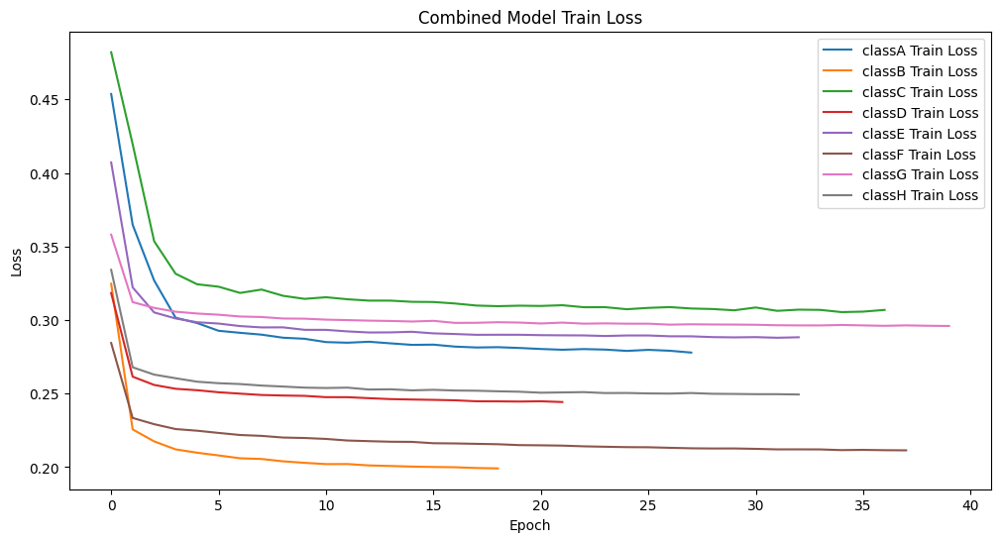

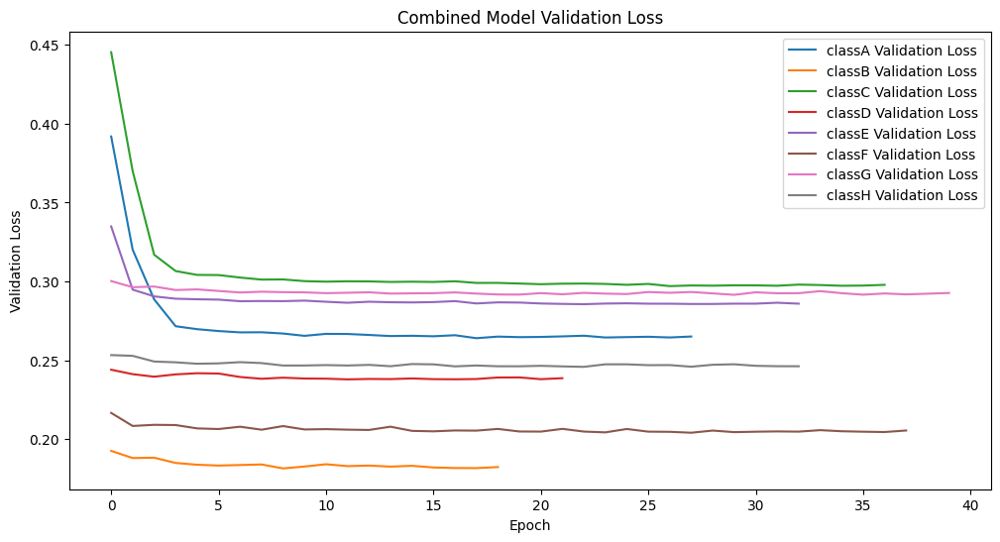

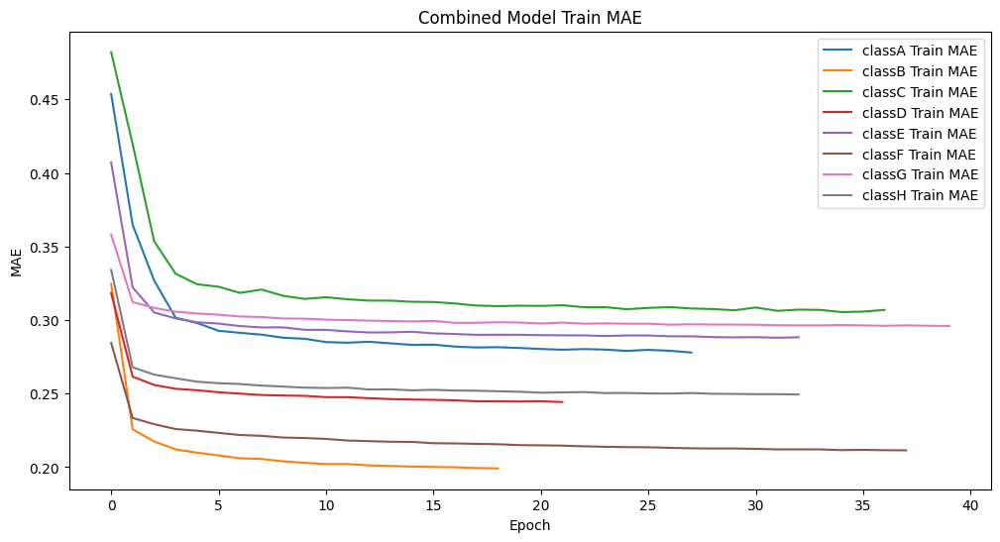

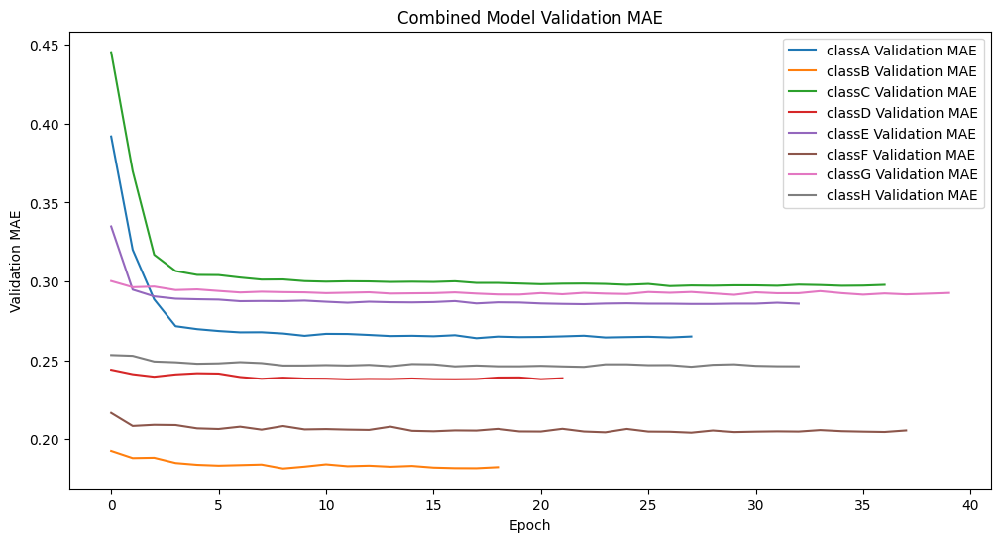

Class: classA, Test MAE: 0.2679586708545685
Class: classB, Test MAE: 0.18230266869068146
Class: classC, Test MAE: 0.2953627407550812
Class: classD, Test MAE: 0.23472747206687927
Class: classE, Test MAE: 0.28309717774391174
Class: classF, Test MAE: 0.20501533150672913
Class: classG, Test MAE: 0.2910374104976654
Class: classH, Test MAE: 0.24435345828533173


In [42]:
# Plot combined results
plot_combined_results(histories, predictions)

# Print summary of results
for class_name, result in results.items():
    print(f'Class: {class_name}, Test MAE: {result["mae"]}')